In [160]:
from PIL import Image
from IPython.display import display
import pytesseract
from pdf2image import convert_from_path, convert_from_bytes
import cv2
from matplotlib import pyplot as plt
import pandas as pd
import fastbook
fastbook.setup_book()
from fastbook import *

/home/tiveron/anaconda3/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:115.)
  return torch._C._cuda_getDeviceCount() > 0
/home/tiveron/anaconda3/lib/python3.8/site-packages/fastbook/__init__.py:19: UserWarning: Missing `graphviz` - please run `conda install fastbook`
  except ModuleNotFoundError: warn("Missing `graphviz` - please run `conda install fastbook`")


# Segmentação de texto e classificação

## Dados

Os dados foram extraídos do diário oficial e passaram por um pré-processamento.

Para utilizar os dados utilizamos as bibliotecas ```pdf2img``` para converter as páginas do pdf para imagens e a ```pytesseract``` para segmentar as imagens.

Dessa forma, após todo o processamento, o dado está pronto para ser categorizado e posteriormente ser utilizado como dado de treino e validação.

## Pré-processamento

In [ ]:
#hide
pdf = convert_from_path('./data/DODF.pdf')

In [155]:
def read_images(first, last):
    images = []

    for i in range(first, last+1):
        images.append(cv2.imread(f'./data/dodf_pag{i}.png'))
    
    return images

images = read_images(5, 15)

In [156]:
areas = []

In [157]:
def draw_boxes_on_page(img, showImage=True):
    d = pytesseract.image_to_data(img, output_type=pytesseract.Output.DICT)
    n_boxes = len(d['level'])
    covered_areas = []
    for i in range(n_boxes):
        if d['level'][i] == 2:

            (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
            areas.append((x,y,w,h))
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
#             covered_areas.append((x,y,w,h))

    if showImage:
        fig, ax = plt.subplots(figsize=(100, 100))
        plt.imshow(img)
        plt.show()

    return covered_areas

### Segmentação

As imagens extraídas do pdf são segmentadas, contornadas em verde utilizando ```cv2```, e ficam da seguinte forma:

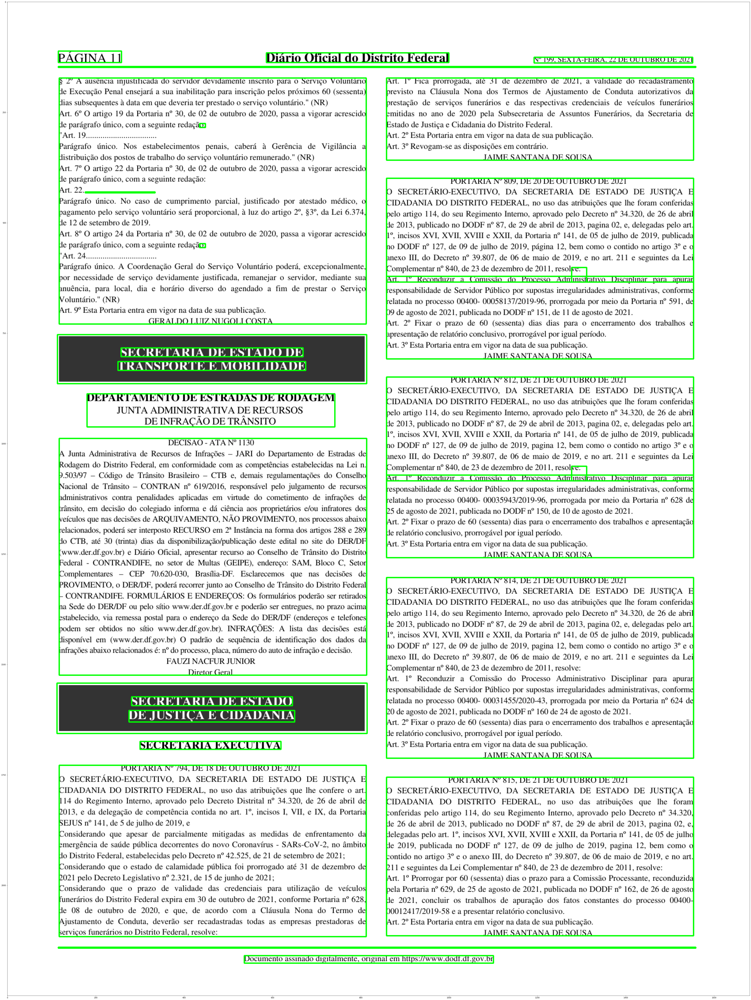

In [158]:
covered_areas = draw_boxes_on_page(images[6])

Pode ser feita uma otimização para a captura apenas de blocos maiores.

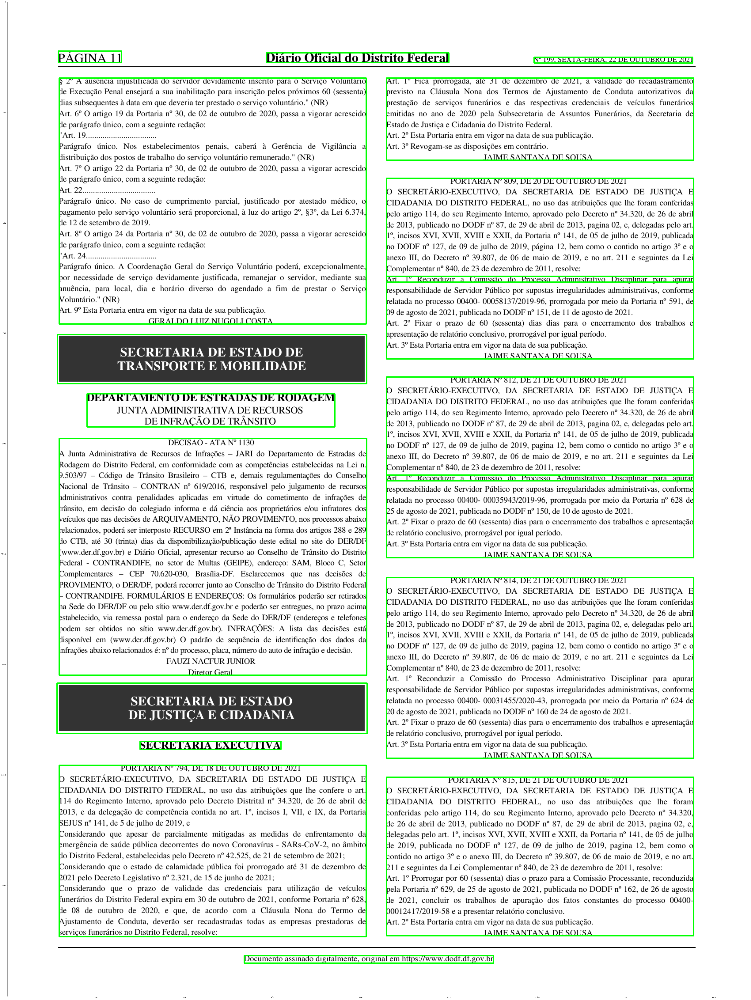

In [159]:
images = read_images(5, 15)
covered_areas = []
areas.sort(key=lambda x:  x[2] * x[3], reverse=True)
for x, y, w, h in areas:
    already_covered = 0
    for x_, y_, w_, h_ in covered_areas:
        
        if x_ <= x and y_ <= y and y_ + h_ >= y + h and x + w <= x_ +  w_:
            already_covered = 1
            break
            
    if not already_covered and h > 12 and w > 2:
        
        cv2.rectangle(images[6], (x, y), (x + w, y + h), (0, 255, 0), 2)
        covered_areas.append((x, y, w, h))

fig, ax = plt.subplots(figsize=(100, 100))
plt.imshow(images[6])
plt.show()

## Entrada do modelo

O modelo é alimentado por imagens, as quais são segmentos das imagens extraídas do pdf oriundas do diário oficial. Esses segmentos, acompanhados dos rótulos correspondentes, formam o dataset. Dessa forma, é possível realizar o treinamento do modelo e, da mesma forma, para futuras predições, seria possível encaminhar um segmento de imagem para o modelo.

## Datablock / Dataloaders

O bloco a ser utilizado é o ImageBlock junto ao CategoryBlock, visto que será uma categorização de imagens com apenas 1 rótulo. Além disso, usaremos o ```get_image_files``` para carregar as imagens de arquivos locais, o parâmetro ```splitter```, até o momento, será feito de forma aleatória, porém também pode ser feita uma distribuição melhor entre as imagens que temos para equilibrar a quantidade de rótulos presentes nos sets de treino e validação. Por fim, o ```get_y``` trará o discernimento acerca da certa rotulação por meio do nome dos arquivos.

Para realizar a manipulação dos dados utilizaremos o ```item_tfms``` com o Resize para padronizar o tamanho dos segmentos de imagem juntamente ao ```pad``` para preencher com uma tarja preta as areas excedentes.

In [161]:
dtb = DataBlock(
                blocks = (ImageBlock, CategoryBlock),
                get_items=get_image_files, 
                splitter=RandomSplitter(seed=42),
                get_y=using_attr(RegexLabeller(r'(.+)_\d+.png$'), 'name'),
                item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros')
               )

## Arquitetura

A arquitetura utilizada será a ```resnet18```, um modelo pré-treinado para classificação de imagens. A ativação é definida pela aproximação feita pelo modelo das métricas definidas para cada rótulo, seguindo a função de ativação, sigmoide.

As dimensões de entrada do modelo são [ 16, 3, _tamanho-img_, _tamanho-img_ ], onde 16 é o tamanho do batch, 3 representando as camadas de RGB e o _tamanho-img_ sendo o tamanho definido no Resize no passo anterior.

Já o output possui as dimensões [ 16 ] pois é um array com a quantidade de imagens que recebeu para então categorisa-las.

## Hiperparâmetros

Os hiperparâmetros são parâmetros que atuam sobre os parâmetros do modelo e são necessários para realizar uma melhor gerência acerca dos pesos utilizados. Dessa forma, para esse projeto utilizados os seguintes hiperparâmetros:

* Pad feito nas imagens
* Separação dos conjuntos de treino e validação

Os segmentos de imagem não tem um tamanho equiparável, o que pode causar problemas para o cálculo nas predições, onde o dado estaria completamente deturpado, para isso definimos o uso do Pad como um tipo de data augmentation. Para a separaćão dos conjuntos é necessário que sigam uma distribuićão onde haja elementos diversificados de labels em cada um.